In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmCompensatedTifs"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_Ice.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish5_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish5_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_CCB.mm', '/media/cjw/Data/cyto/mmComp

dict_keys(['Fish3_CCB.mm', 'Fish4_ICE.mm', 'Fish3_Untreated.mm', 'Fish6_Untreated.mm', 'Fish2_Untreated.mm', 'Fish1_Ice.mm', 'Fish5_Untreated.mm', 'Fish6_ICE.mm', 'Fish4_CCB.mm', 'Fish6_CCB.mm', 'Fish2_CCB.mm', 'Fish1_Untreated.mm', 'Fish4_Untreated.mm', 'Fish2_ICE.mm', 'Fish5_CCB.mm', 'Fish3_ICE.mm', 'Fish1_CCB.mm', 'Fish5_ICE.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


Encoder True
[<tf.Tensor 'Placeholder:0' shape=(?, 32, 32, 4) dtype=float32>, <tf.Tensor 'dropout/mul:0' shape=(?, 16, 16, 128) dtype=float32>, <tf.Tensor 'dropout_1/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_2/mul:0' shape=(?, 4, 4, 512) dtype=float32>] Tensor("latent_space/BiasAdd:0", shape=(?, 256), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 4)
[<tf.Tensor 'dropout_3/mul:0' shape=(?, 8192) dtype=float32>, <tf.Tensor 'Reshape:0' shape=(?, 4, 4, 512) dtype=float32>, <tf.Tensor 'dropout_4/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_5/mul:0' shape=(?, 16, 16, 128) dtype=float32>] Tensor("Minimum:0", shape=(?, 32, 32, 4), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
180000 1406 128
Epoch:  0 Iteration:  0 Loss:  616.721 2.84002 0.29455


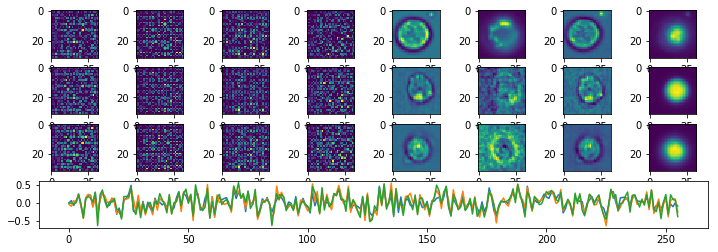

Epoch:  0 Iteration:  500 Loss:  14.0968 0.636167 0.00175852


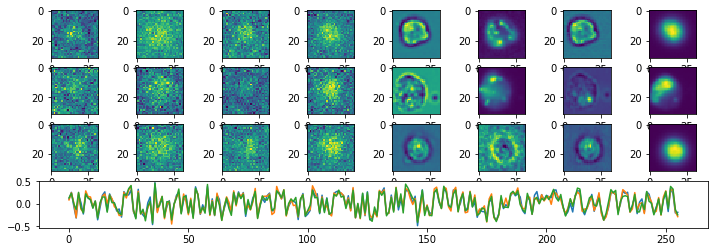

Epoch:  0 Iteration:  1000 Loss:  11.9826 0.635056 0.00239301


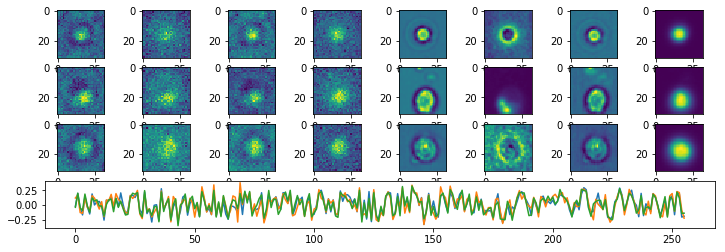

Epoch:  1 Iteration:  0 Loss:  10.1204 0.633916 0.00184926


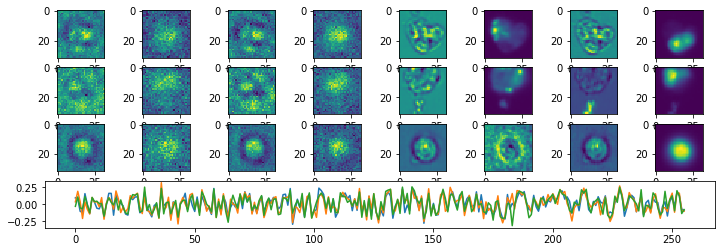

Epoch:  1 Iteration:  500 Loss:  8.24637 0.633076 0.00188491


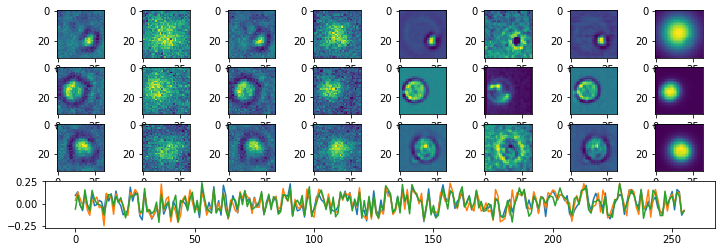

Epoch:  1 Iteration:  1000 Loss:  7.25255 0.632539 0.00140455


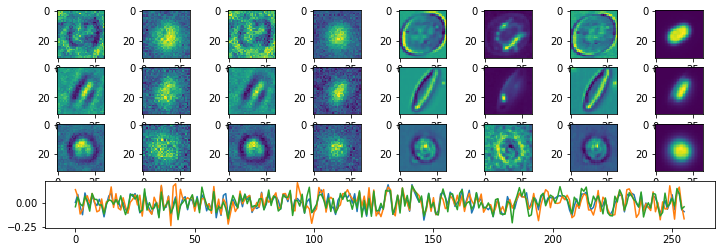

Epoch:  2 Iteration:  0 Loss:  6.7441 0.632123 0.000768453


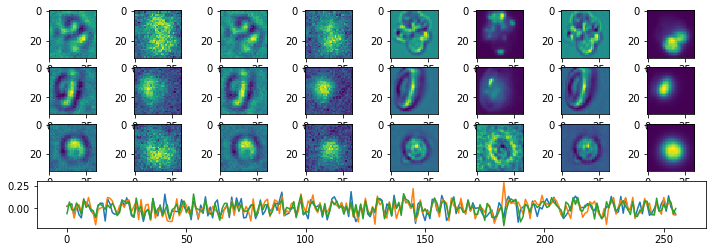

Epoch:  2 Iteration:  500 Loss:  6.12993 0.631961 0.00120267


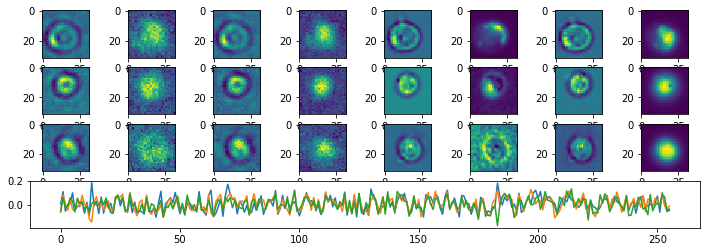

Epoch:  2 Iteration:  1000 Loss:  5.83445 0.631794 0.00164562


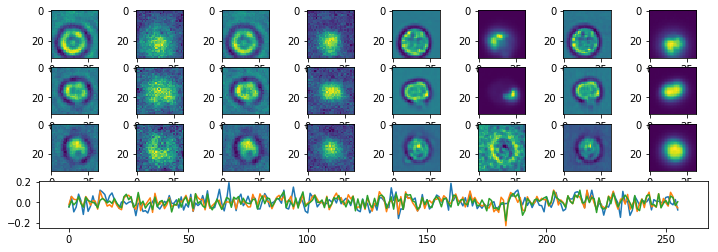

Epoch:  3 Iteration:  0 Loss:  5.43068 0.631433 0.000721842


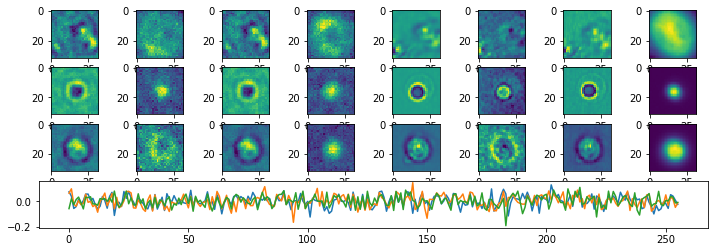

Epoch:  3 Iteration:  500 Loss:  5.04155 0.631382 0.000629574


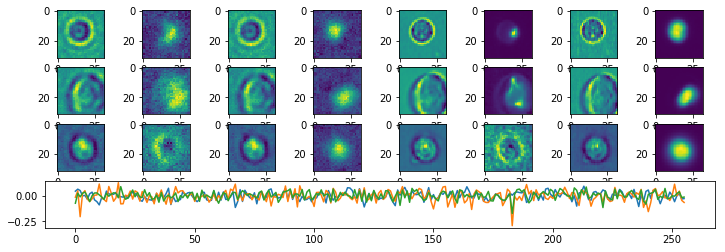

Epoch:  3 Iteration:  1000 Loss:  4.7368 0.631207 0.000676453


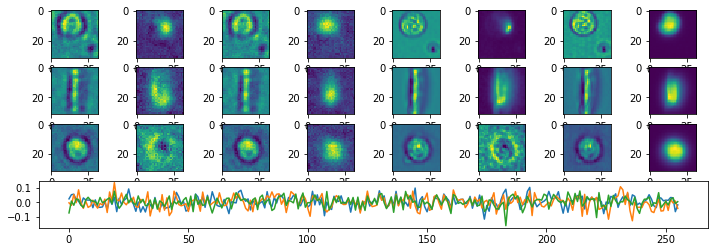

Epoch:  4 Iteration:  0 Loss:  4.45482 0.630913 0.00050357


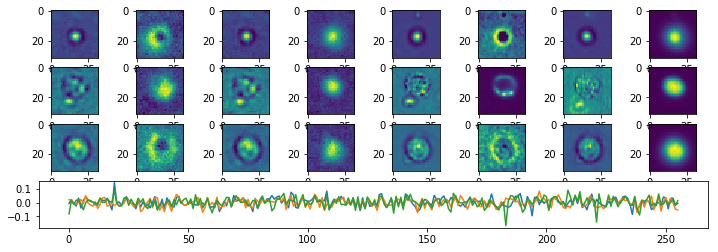

Epoch:  4 Iteration:  500 Loss:  4.37068 0.631029 0.000699878


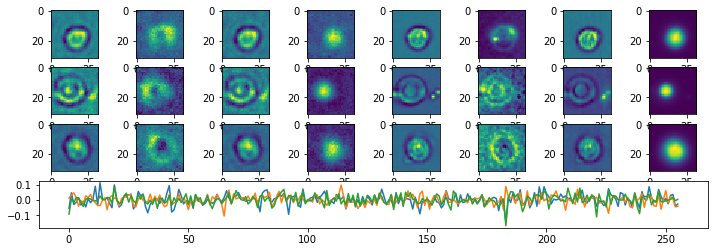

Epoch:  4 Iteration:  1000 Loss:  4.17278 0.630911 0.000612795


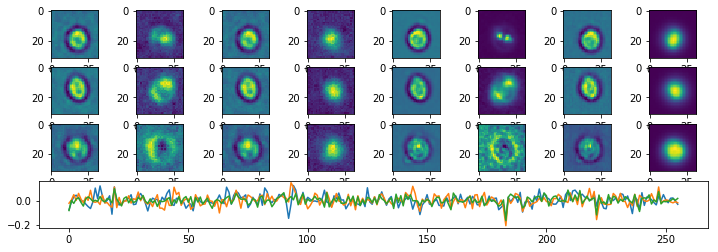

Epoch:  5 Iteration:  0 Loss:  3.93579 0.630637 0.000926435


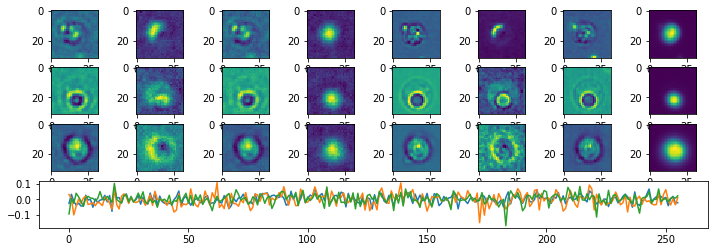

Epoch:  5 Iteration:  500 Loss:  3.91365 0.630791 0.000395


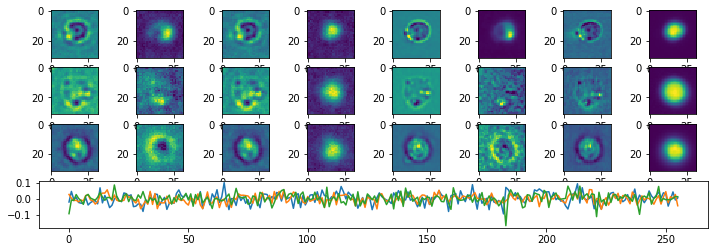

Epoch:  5 Iteration:  1000 Loss:  3.78199 0.630703 0.000564069


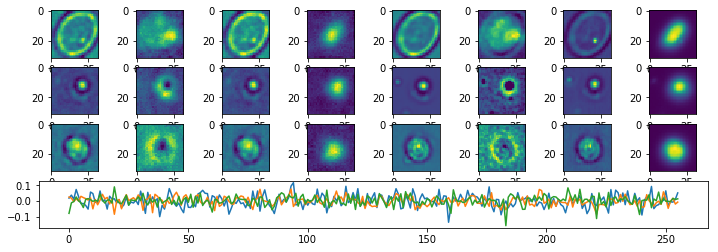

Epoch:  6 Iteration:  0 Loss:  3.61525 0.63047 0.000293881


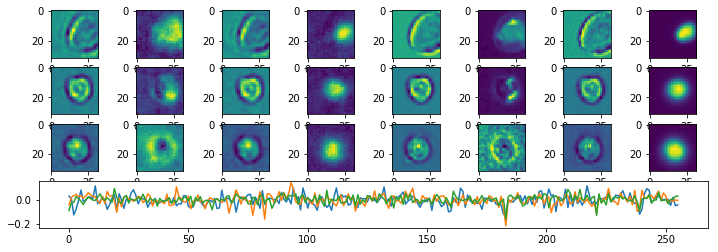

Epoch:  6 Iteration:  500 Loss:  3.5685 0.63061 0.000583738


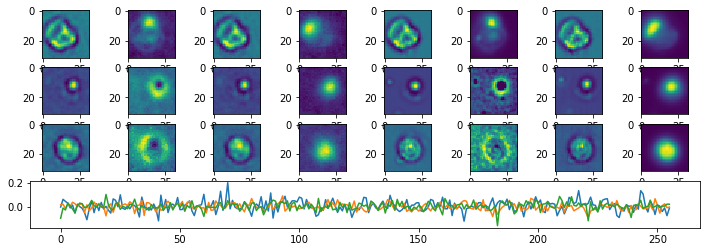

Epoch:  6 Iteration:  1000 Loss:  3.47361 0.630542 0.000300527


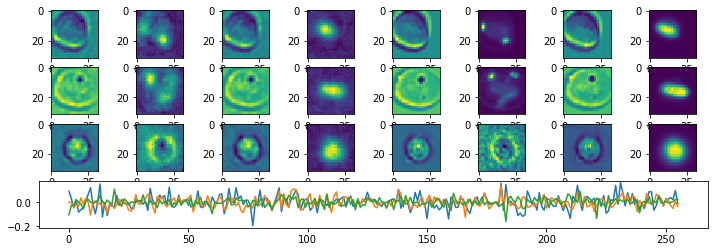

Epoch:  7 Iteration:  0 Loss:  3.32336 0.630319 0.000297517


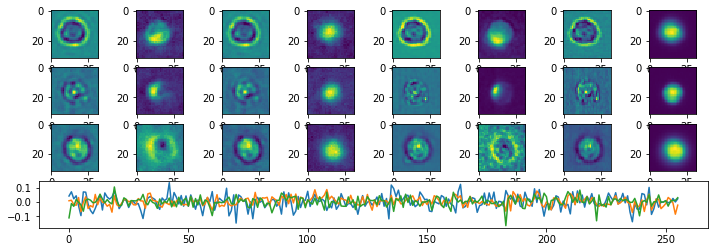

Epoch:  7 Iteration:  500 Loss:  3.33357 0.630489 0.000149935


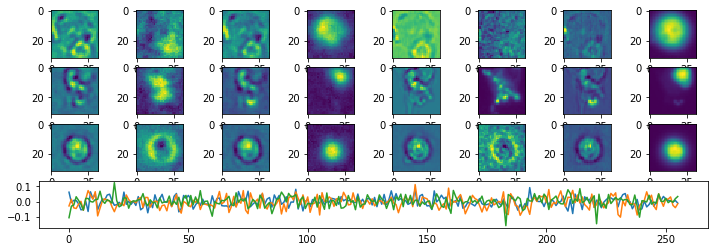

Epoch:  7 Iteration:  1000 Loss:  3.23779 0.630419 0.000401407


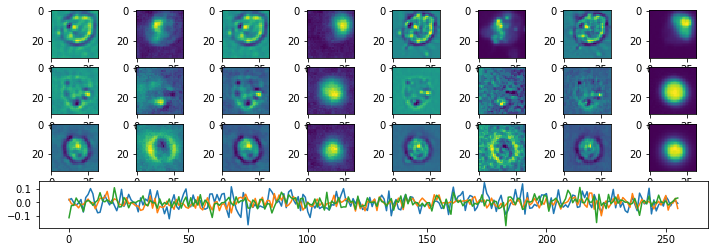

Epoch:  8 Iteration:  0 Loss:  3.09379 0.630203 0.000609815


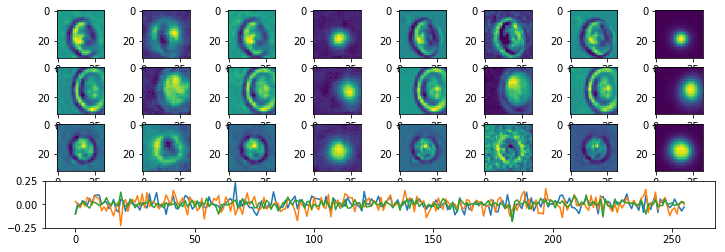

Epoch:  8 Iteration:  500 Loss:  3.13599 0.630388 0.000608921


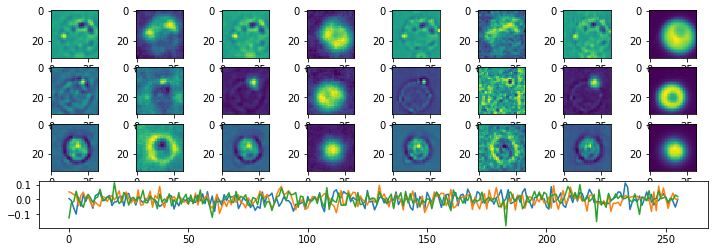

Epoch:  8 Iteration:  1000 Loss:  3.0236 0.63031 0.00012058


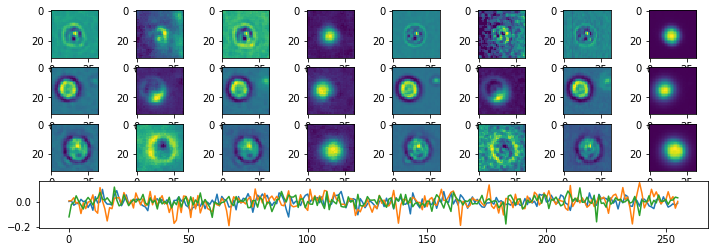

Epoch:  9 Iteration:  0 Loss:  2.94352 0.630124 0.000117809


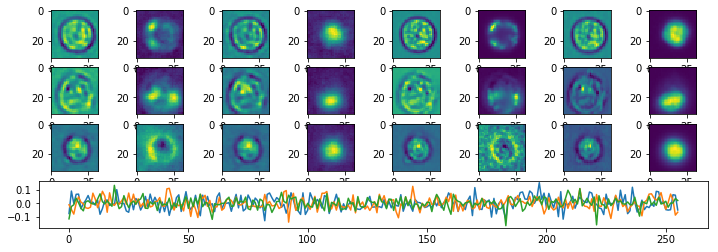

Epoch:  9 Iteration:  500 Loss:  2.95308 0.630292 0.000470817


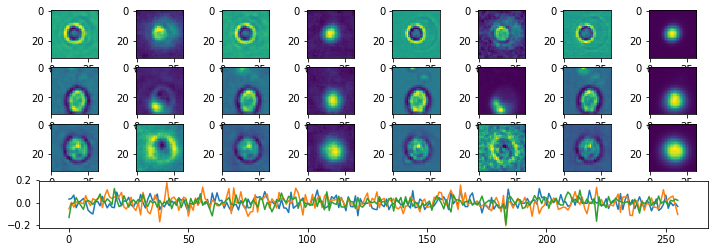

Epoch:  9 Iteration:  1000 Loss:  2.87772 0.630236 0.000322819


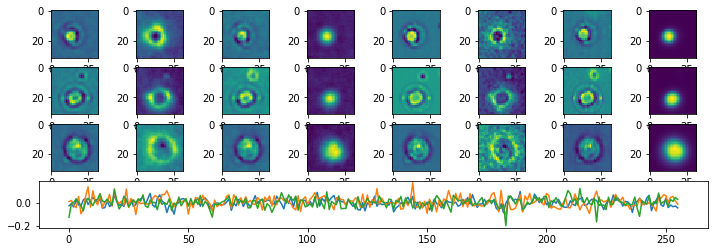

Epoch:  10 Iteration:  0 Loss:  2.75782 0.630025 0.000373572


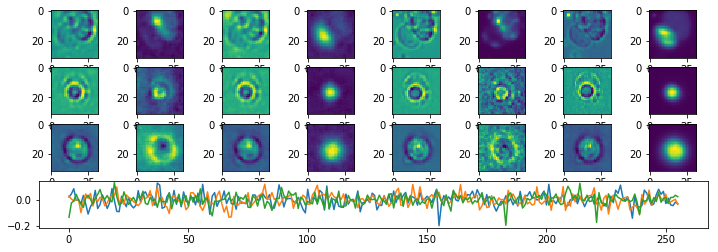

Epoch:  10 Iteration:  500 Loss:  2.86496 0.630247 0.000497878


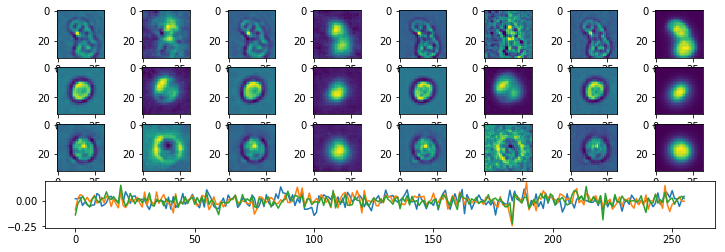

Epoch:  10 Iteration:  1000 Loss:  2.72554 0.630157 0.000210881


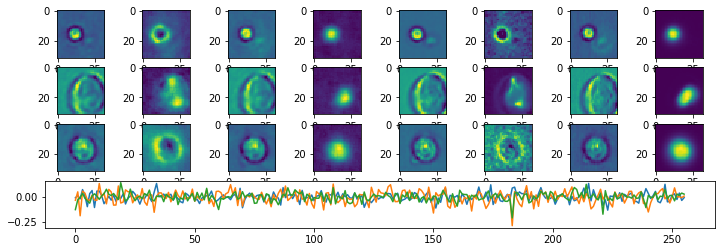

Epoch:  11 Iteration:  0 Loss:  2.65471 0.629972 0.000250638


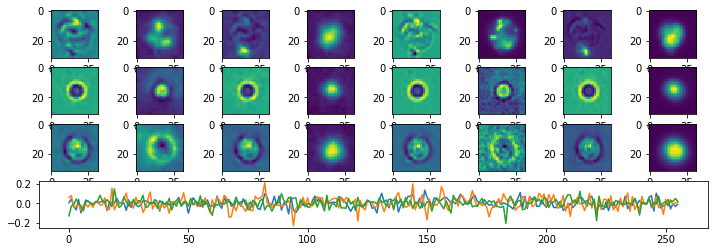

Epoch:  11 Iteration:  500 Loss:  2.72663 0.630176 0.000252306


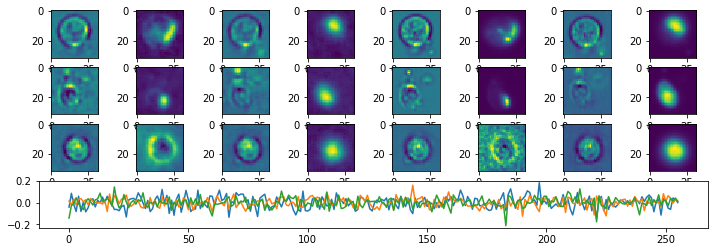

Epoch:  11 Iteration:  1000 Loss:  2.63256 0.630108 0.00022617


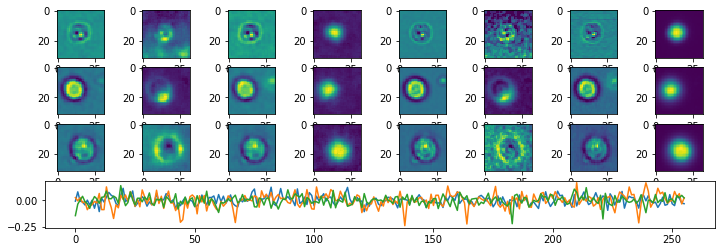

Epoch:  12 Iteration:  0 Loss:  2.57076 0.629927 0.000447124


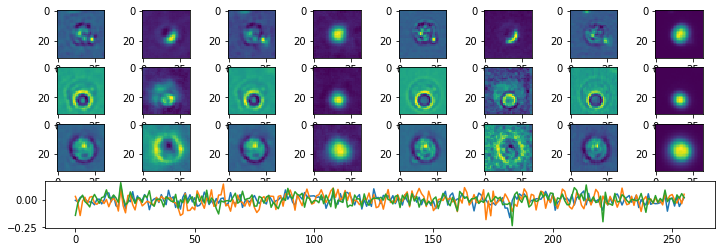

Epoch:  12 Iteration:  500 Loss:  2.678 0.630149 0.00108412


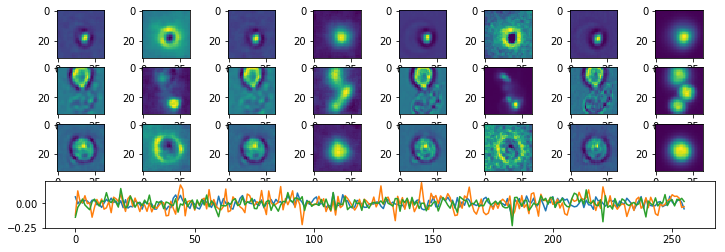

Epoch:  12 Iteration:  1000 Loss:  2.55678 0.630069 9.68277e-05


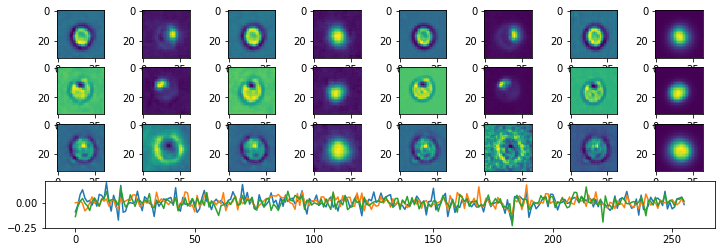

Epoch:  13 Iteration:  0 Loss:  2.519 0.629901 0.000325471


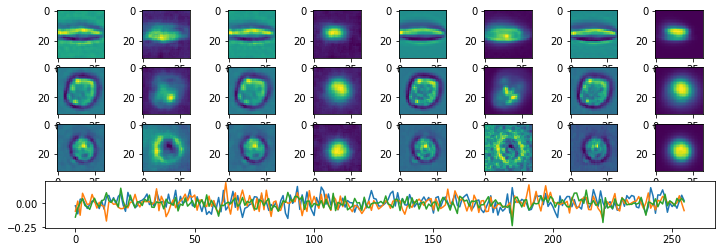

Epoch:  13 Iteration:  500 Loss:  2.58099 0.630099 0.000357121


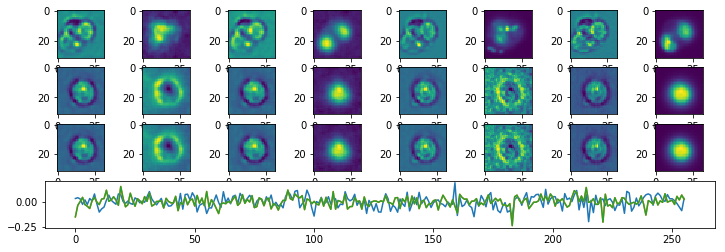

Epoch:  13 Iteration:  1000 Loss:  2.82395 0.63021 0.00028646


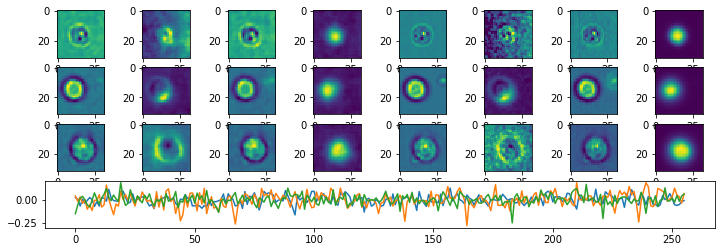

Epoch:  14 Iteration:  0 Loss:  2.66116 0.629976 0.000394136


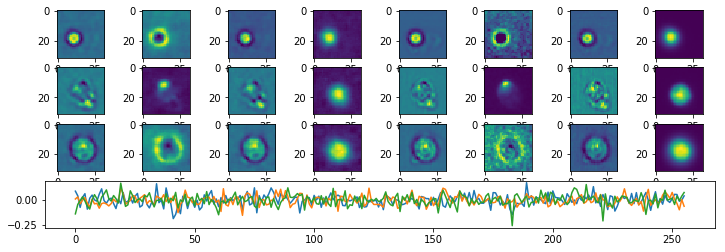

Epoch:  14 Iteration:  500 Loss:  2.68943 0.630157 0.000351459


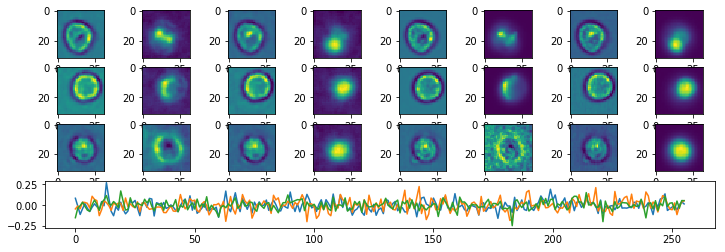

Epoch:  14 Iteration:  1000 Loss:  2.59556 0.63009 0.000297874


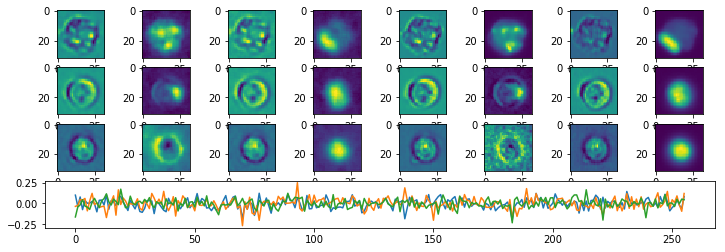

Epoch:  15 Iteration:  0 Loss:  2.53037 0.629907 0.000262111


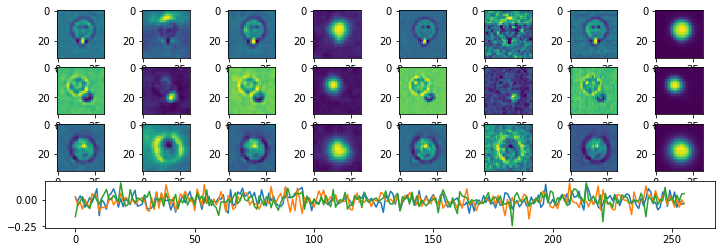

Epoch:  15 Iteration:  500 Loss:  2.6143 0.630118 0.00030148


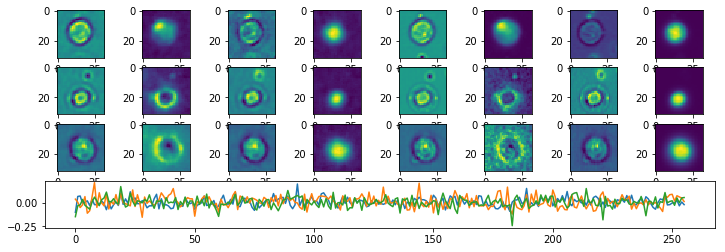

Epoch:  15 Iteration:  1000 Loss:  2.51782 0.630049 0.000334322


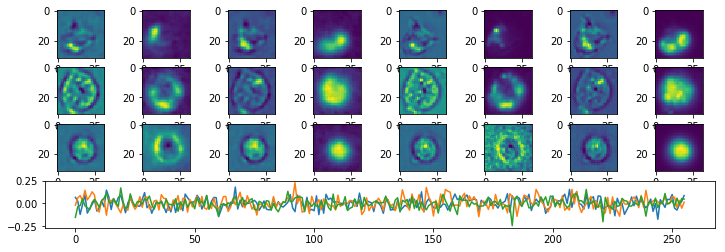

Epoch:  16 Iteration:  0 Loss:  2.48766 0.629884 0.000330925


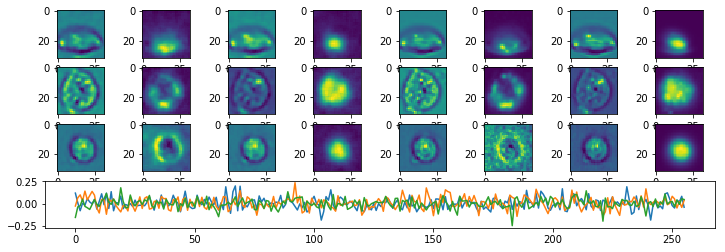

Epoch:  16 Iteration:  500 Loss:  2.56627 0.630092 0.000302196


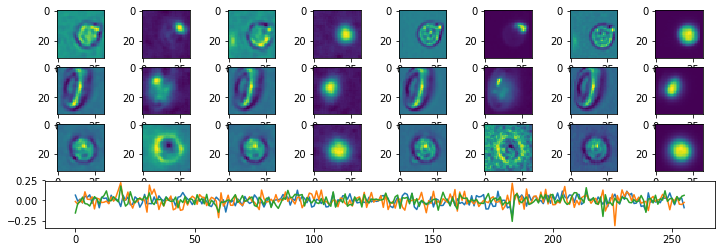

Epoch:  16 Iteration:  1000 Loss:  2.49245 0.630035 0.000228643


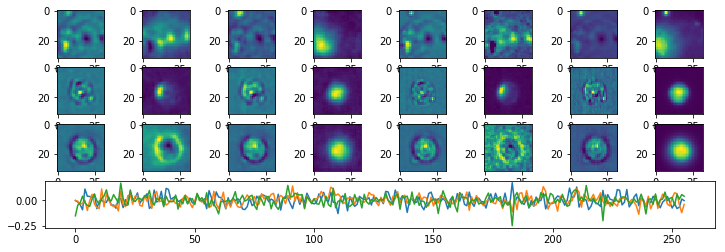

Epoch:  17 Iteration:  0 Loss:  2.46664 0.629874 0.000359148


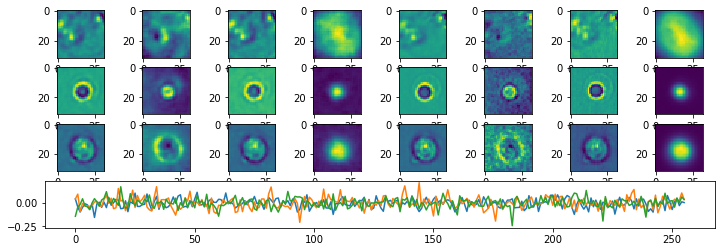

Epoch:  17 Iteration:  500 Loss:  2.5229 0.630069 0.000266135


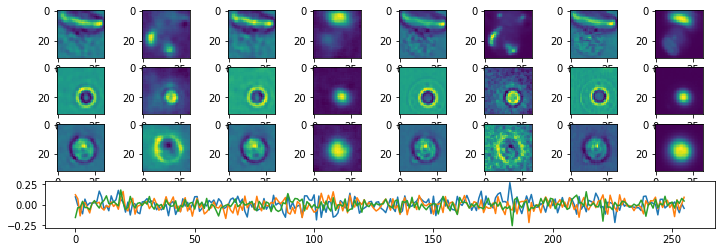

Epoch:  17 Iteration:  1000 Loss:  2.45207 0.630015 0.000390261


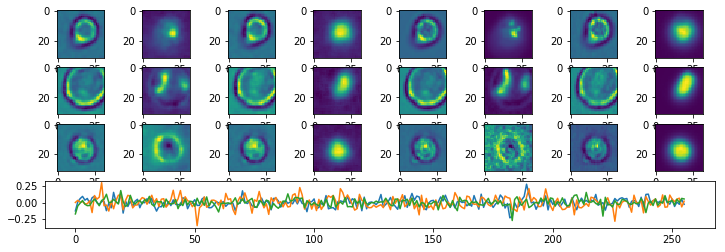

Epoch:  18 Iteration:  0 Loss:  2.42011 0.629849 0.00034222


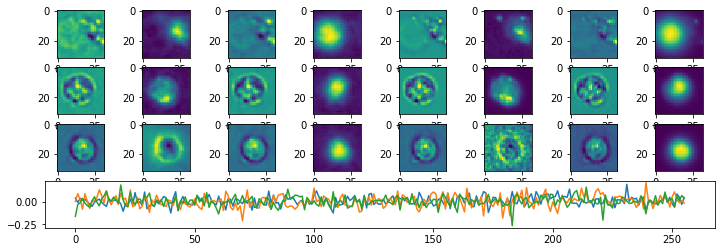

Epoch:  18 Iteration:  500 Loss:  2.50093 0.630058 0.000169456


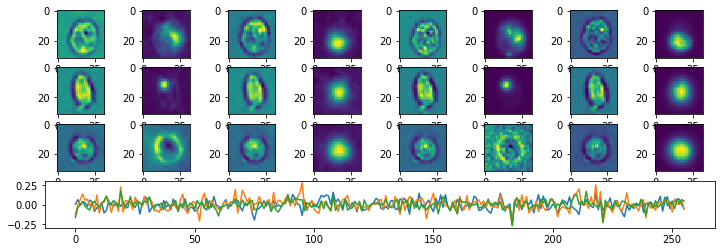

Epoch:  18 Iteration:  1000 Loss:  2.42711 0.630002 0.000165015


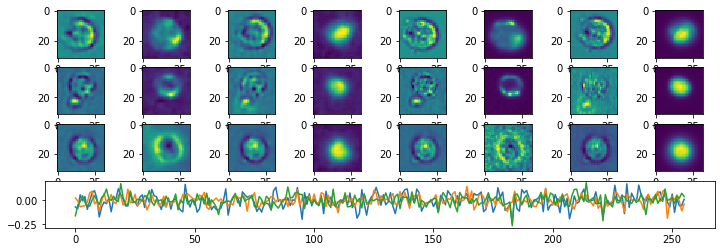

Epoch:  19 Iteration:  0 Loss:  2.40054 0.629838 0.000608087


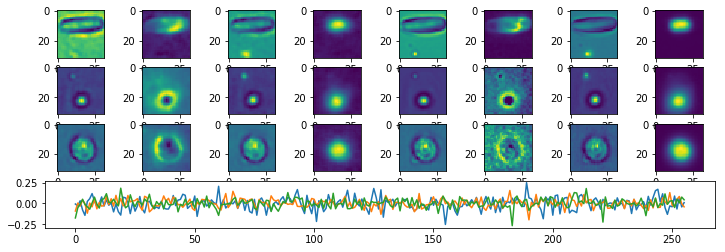

Epoch:  19 Iteration:  500 Loss:  2.48323 0.630052 0.000820875


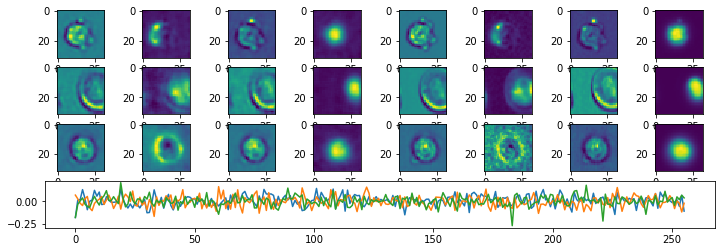

Epoch:  19 Iteration:  1000 Loss:  2.40242 0.629989 0.000219345


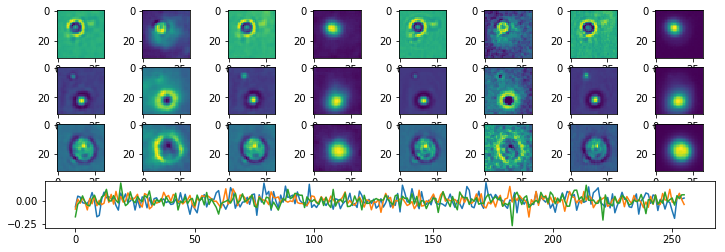

Epoch:  20 Iteration:  0 Loss:  2.35814 0.629817 0.000275463


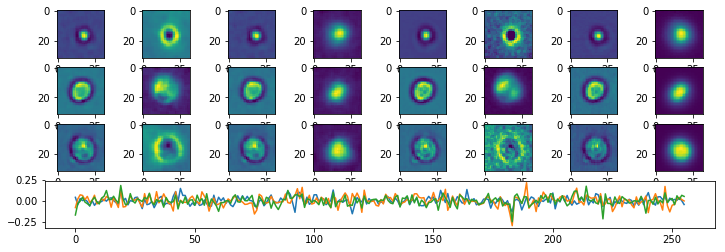

Epoch:  20 Iteration:  500 Loss:  2.42934 0.630021 0.000317961


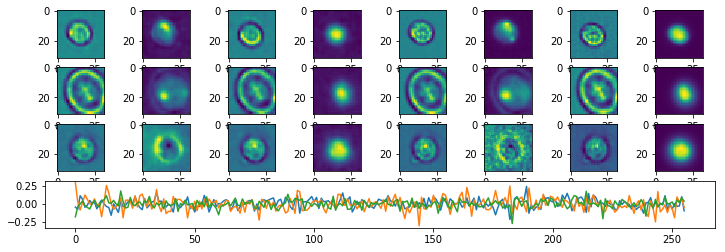

Epoch:  20 Iteration:  1000 Loss:  2.37738 0.629976 0.000163645


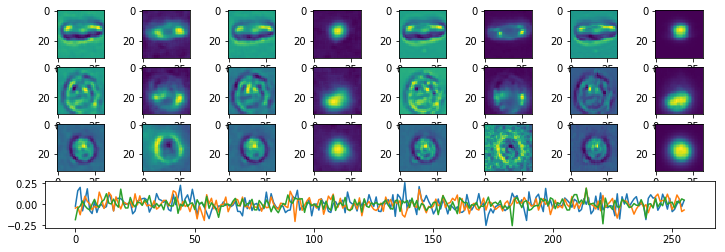

Epoch:  21 Iteration:  0 Loss:  2.33111 0.629803 0.000244051


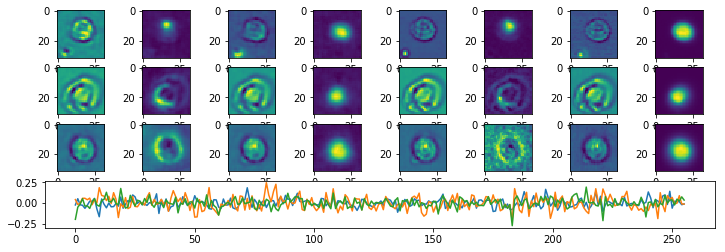

Epoch:  21 Iteration:  500 Loss:  2.43816 0.630028 0.000757068


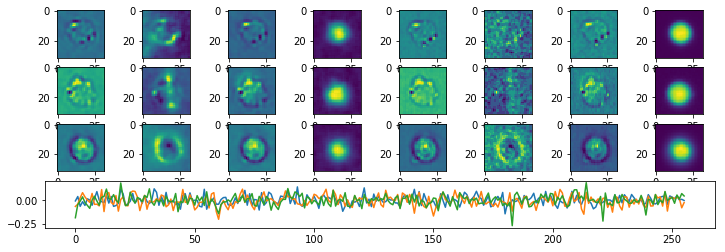

Epoch:  21 Iteration:  1000 Loss:  2.35524 0.629964 0.000315875


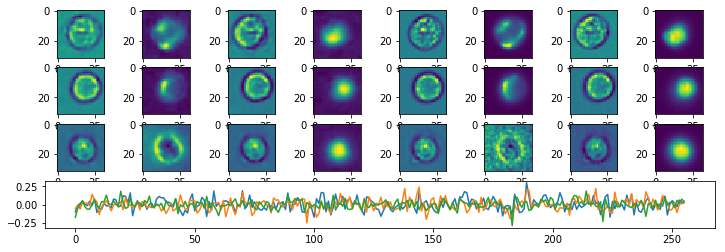

Epoch:  22 Iteration:  0 Loss:  2.29754 0.629785 0.000378758


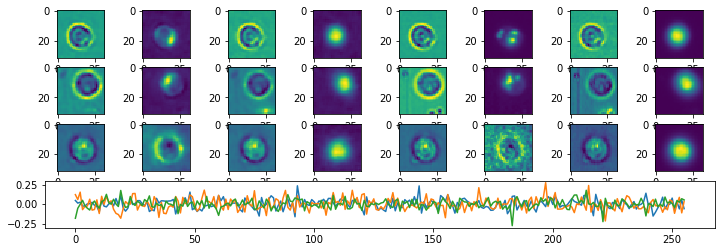

Epoch:  22 Iteration:  500 Loss:  3.31807 0.630493 0.000534236


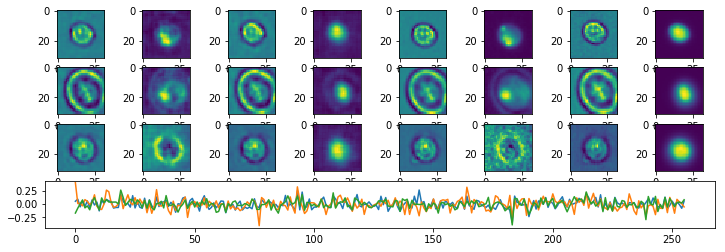

Epoch:  22 Iteration:  1000 Loss:  2.71007 0.630151 0.000372082


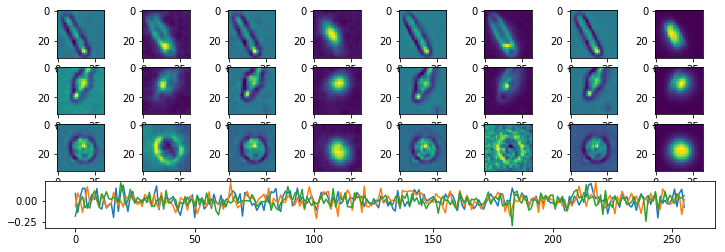

Epoch:  23 Iteration:  0 Loss:  2.55911 0.629924 0.000203073


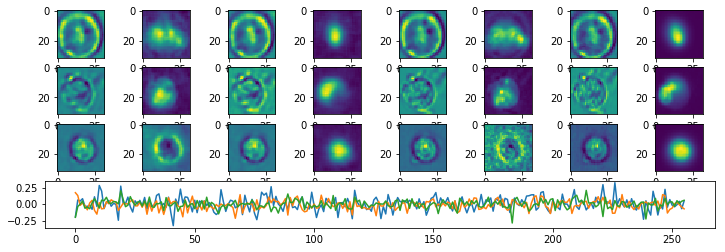

Epoch:  23 Iteration:  500 Loss:  2.57901 0.630105 0.00041005


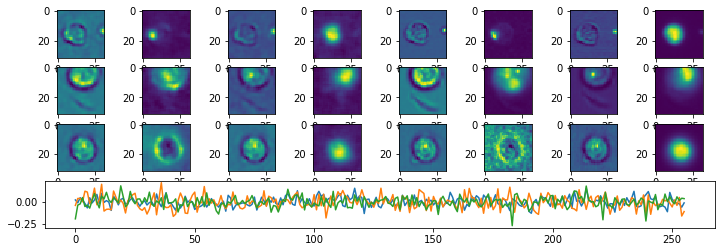

Epoch:  23 Iteration:  1000 Loss:  2.46281 0.630021 0.000257134


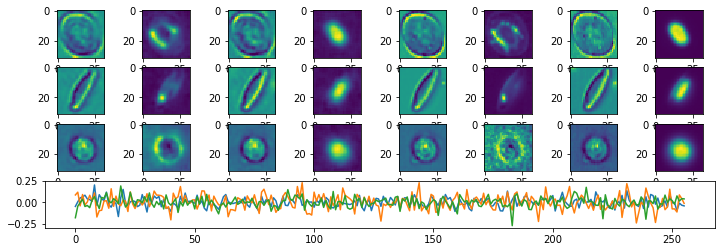

Epoch:  24 Iteration:  0 Loss:  2.40008 0.62984 0.000294447


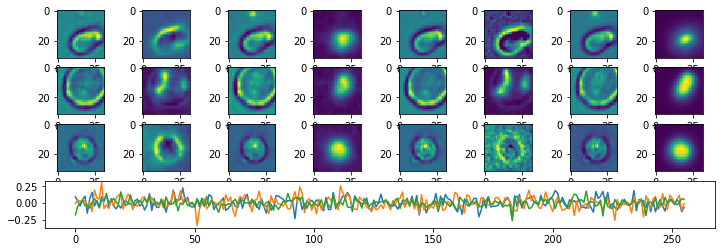

Epoch:  24 Iteration:  500 Loss:  2.47305 0.630045 0.000196725


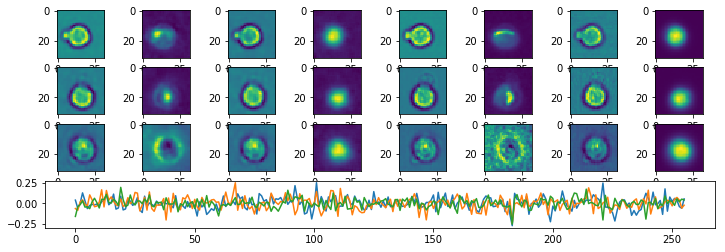

Epoch:  24 Iteration:  1000 Loss:  2.37085 0.629973 0.00025177


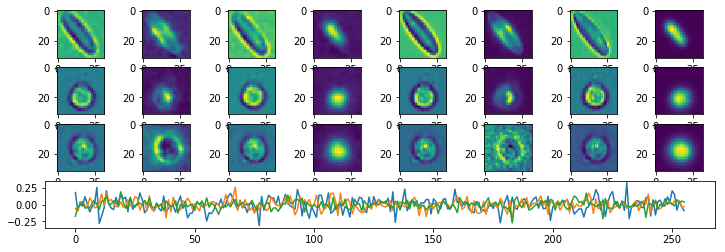

Epoch:  25 Iteration:  0 Loss:  2.33922 0.629807 0.000268191


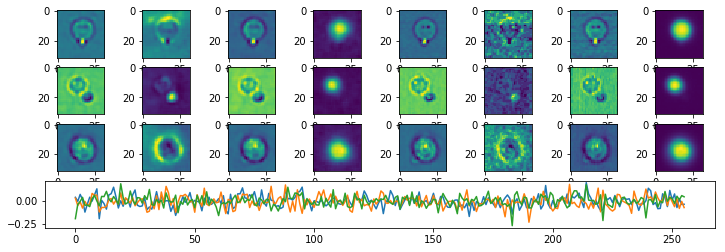

Epoch:  25 Iteration:  500 Loss:  2.40224 0.630007 0.000362486


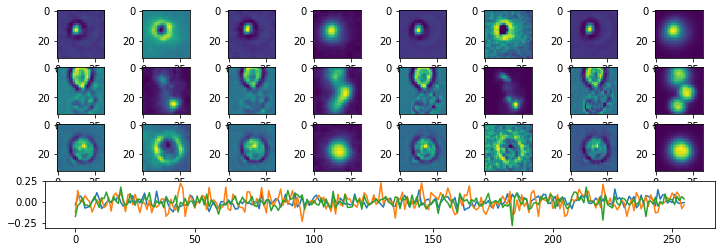

Epoch:  25 Iteration:  1000 Loss:  2.33947 0.629956 0.000212491


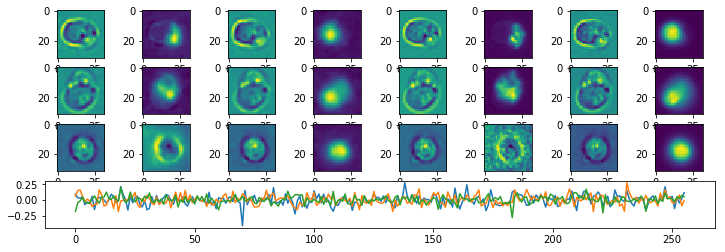

Epoch:  26 Iteration:  0 Loss:  2.31055 0.629793 0.000298023


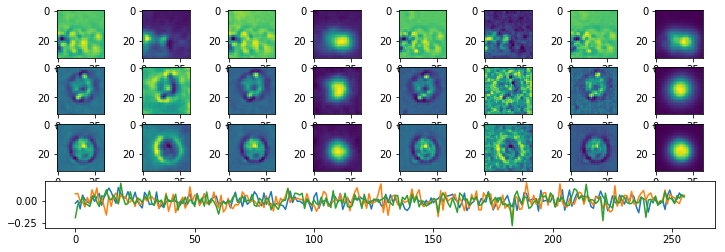

Epoch:  26 Iteration:  500 Loss:  2.38273 0.629997 0.000303984


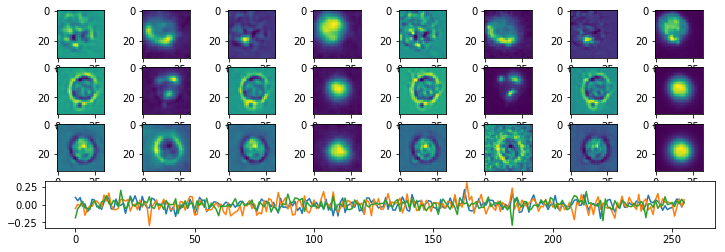

Epoch:  26 Iteration:  1000 Loss:  2.31468 0.629943 0.000226051


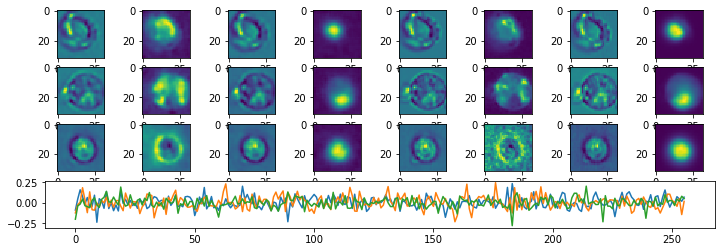

Epoch:  27 Iteration:  0 Loss:  2.27864 0.629776 0.000235915


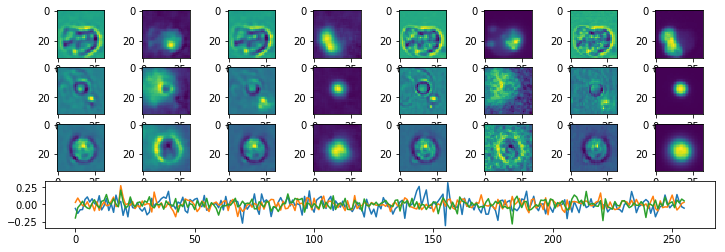

Epoch:  27 Iteration:  500 Loss:  2.39682 0.630004 0.000919998


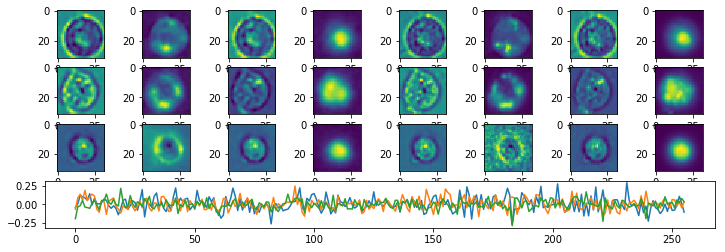

Epoch:  27 Iteration:  1000 Loss:  2.28927 0.62993 0.000143975


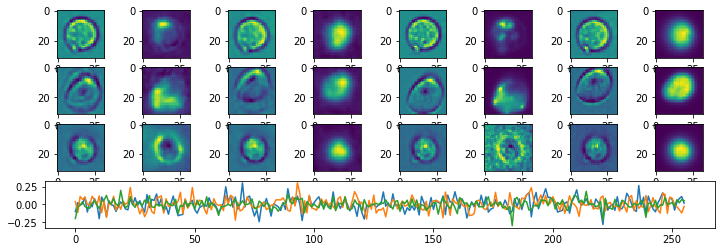

Epoch:  28 Iteration:  0 Loss:  2.2733 0.629773 0.000496328


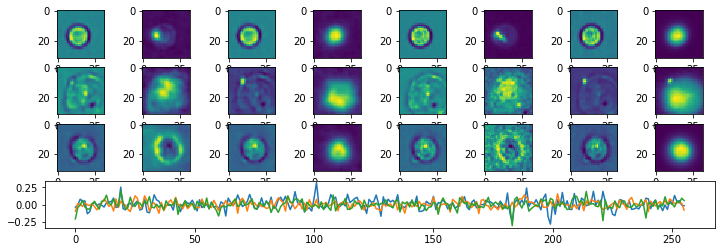

Epoch:  28 Iteration:  500 Loss:  2.33462 0.629973 0.000330448


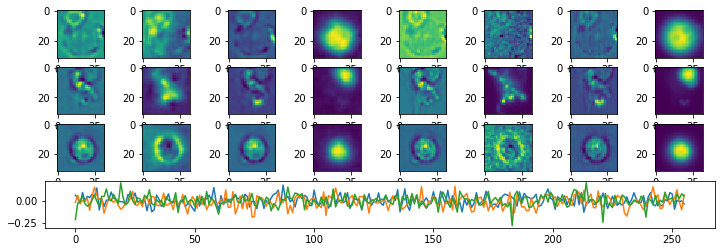

Epoch:  28 Iteration:  1000 Loss:  2.28206 0.629926 0.000230044


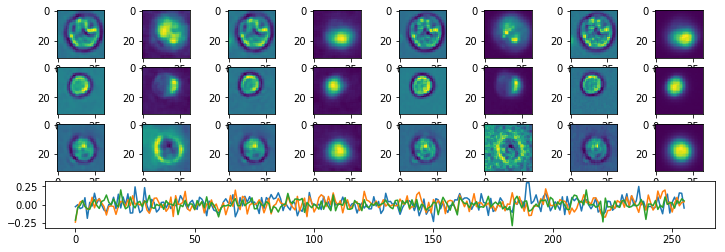

Epoch:  29 Iteration:  0 Loss:  2.23704 0.629754 0.000227123


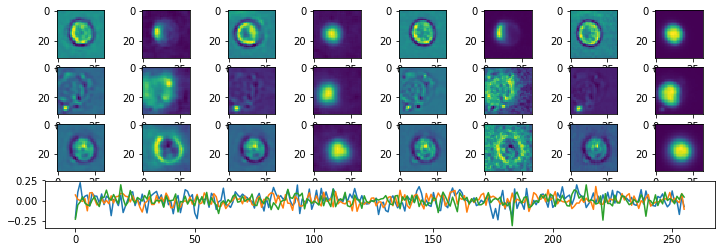

Epoch:  29 Iteration:  500 Loss:  2.31679 0.629963 0.000151187


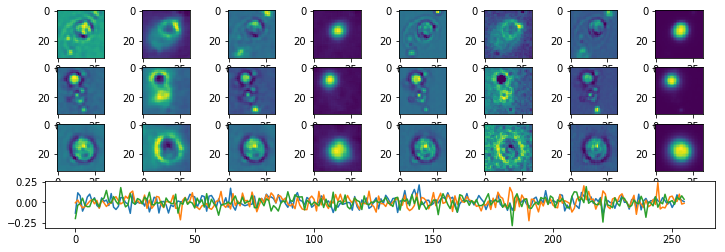

Epoch:  29 Iteration:  1000 Loss:  2.79453 0.630194 0.000304699


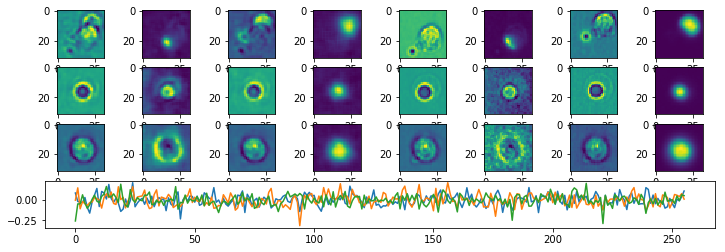

Epoch:  30 Iteration:  0 Loss:  2.49309 0.629889 0.000287443


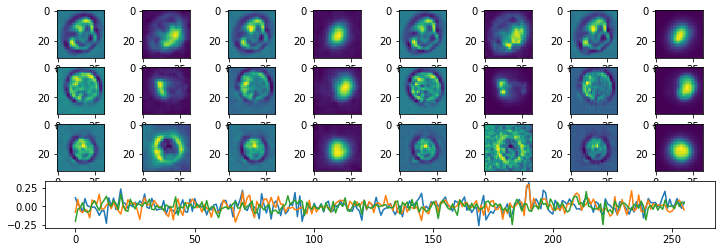

Epoch:  30 Iteration:  500 Loss:  2.48972 0.630054 0.000341088


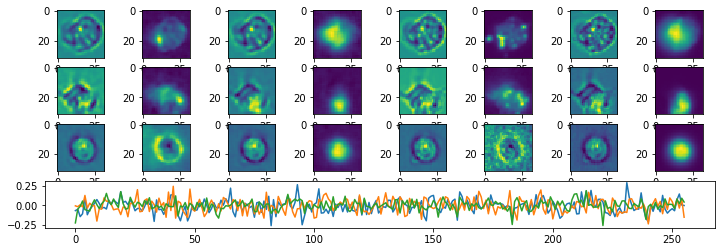

Epoch:  30 Iteration:  1000 Loss:  2.37378 0.629974 0.000266254


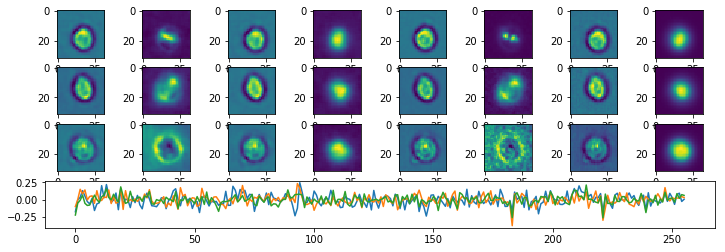

Epoch:  31 Iteration:  0 Loss:  2.31729 0.629796 0.000245214


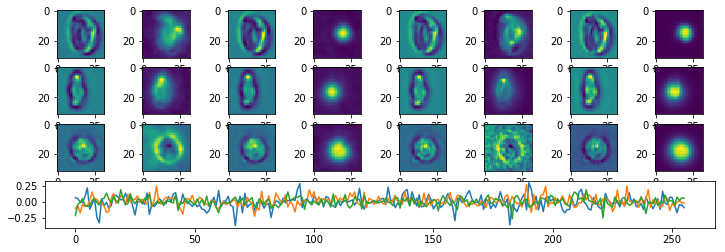

Epoch:  31 Iteration:  500 Loss:  2.39682 0.630004 0.000297844


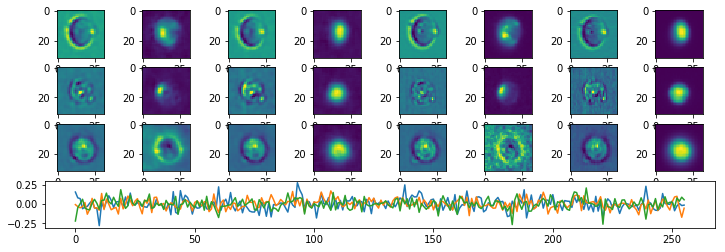

Epoch:  31 Iteration:  1000 Loss:  2.30407 0.629937 0.000234246


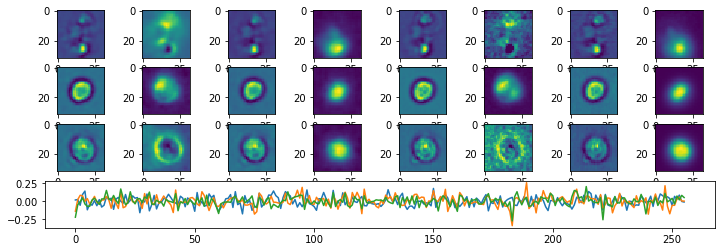

Epoch:  32 Iteration:  0 Loss:  2.26022 0.629766 0.000274092


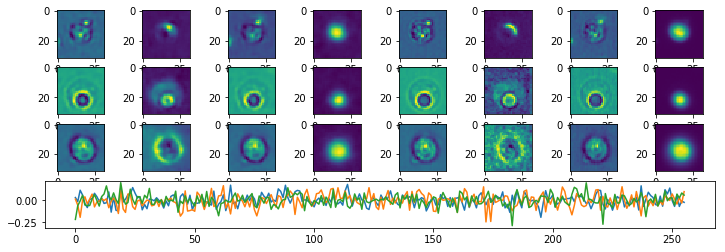

Epoch:  32 Iteration:  500 Loss:  2.31985 0.629966 0.000261426


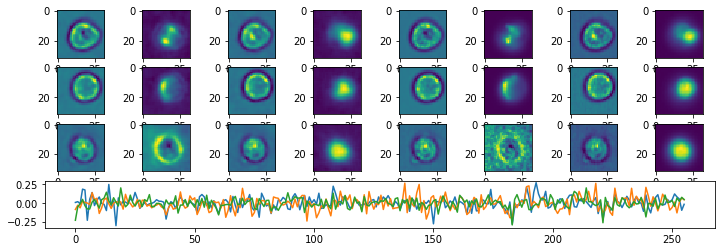

Epoch:  32 Iteration:  1000 Loss:  2.27693 0.629923 0.000174582


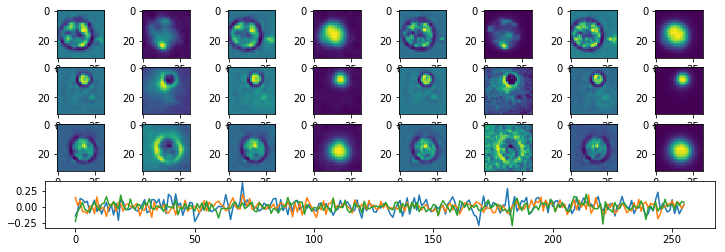

Epoch:  33 Iteration:  0 Loss:  2.241 0.629756 0.000308514


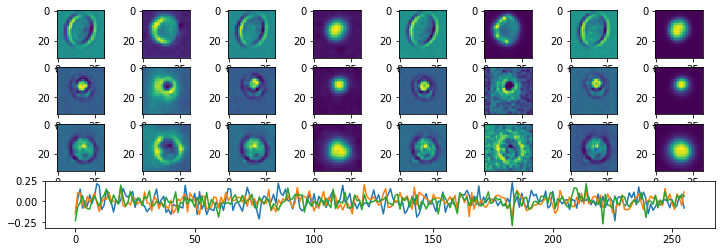

Epoch:  33 Iteration:  500 Loss:  2.31848 0.629966 0.00039801


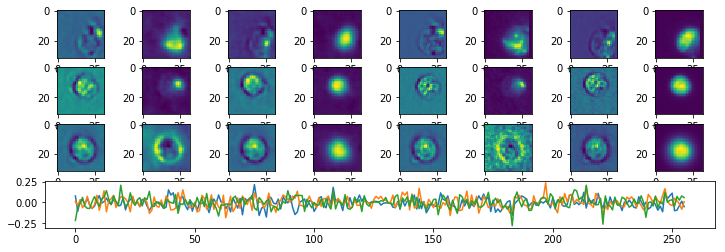

Epoch:  33 Iteration:  1000 Loss:  2.25843 0.629914 0.000147283


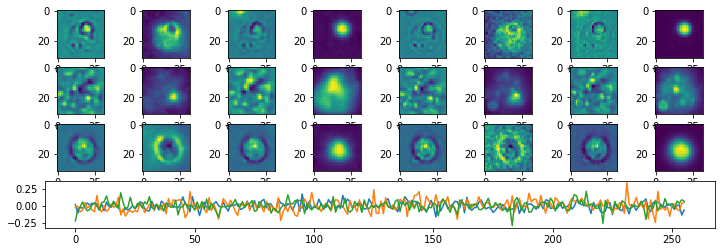

Epoch:  34 Iteration:  0 Loss:  2.22667 0.629748 0.000588477


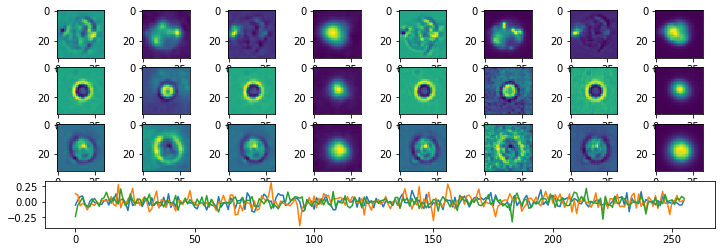

Epoch:  34 Iteration:  500 Loss:  2.29662 0.629952 0.000186354


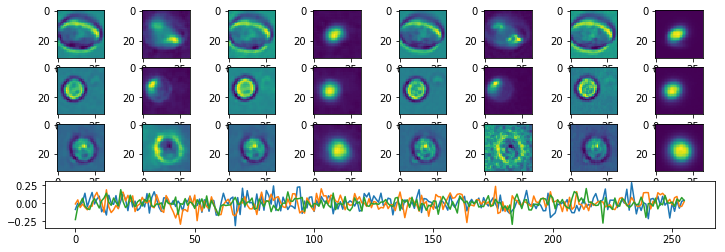

Epoch:  34 Iteration:  1000 Loss:  2.24214 0.629906 0.000143558


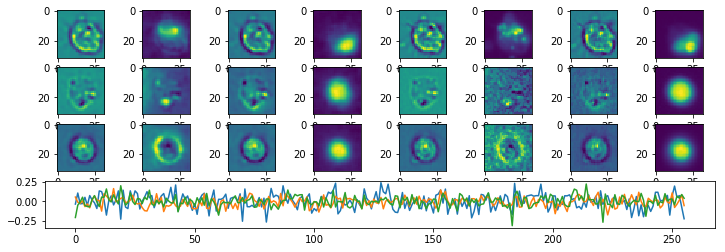

Epoch:  35 Iteration:  0 Loss:  2.20861 0.629739 0.000116676


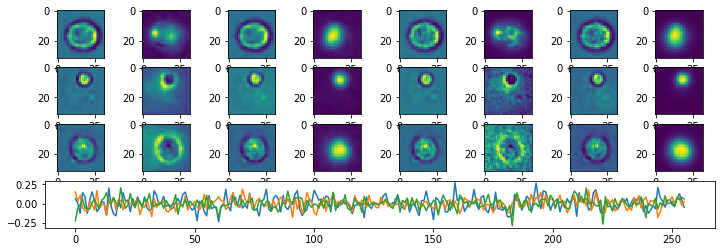

Epoch:  35 Iteration:  500 Loss:  2.29623 0.629955 5.47171e-05


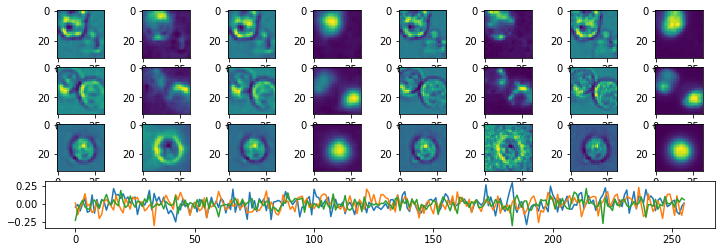

Epoch:  35 Iteration:  1000 Loss:  2.22799 0.629898 0.000305653


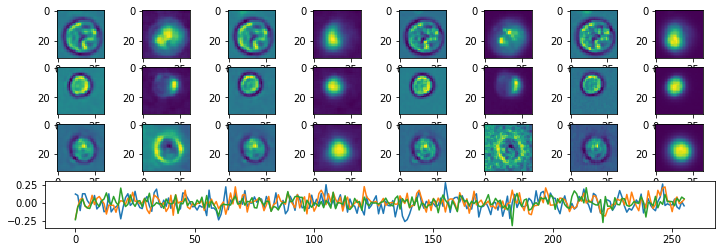

Epoch:  36 Iteration:  0 Loss:  2.18792 0.629729 0.000350803


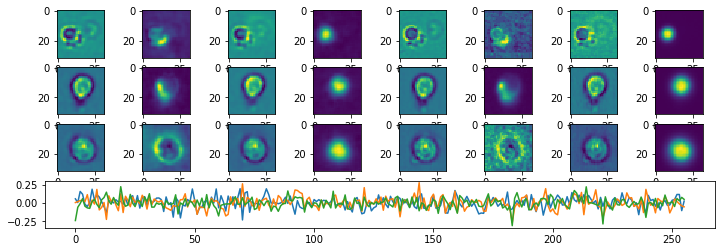

Epoch:  36 Iteration:  500 Loss:  2.2712 0.629939 7.7188e-05


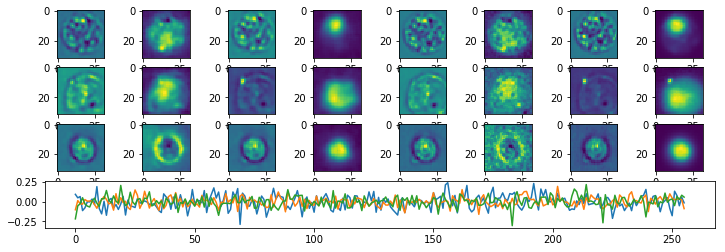

Epoch:  36 Iteration:  1000 Loss:  2.21392 0.62989 0.000301421


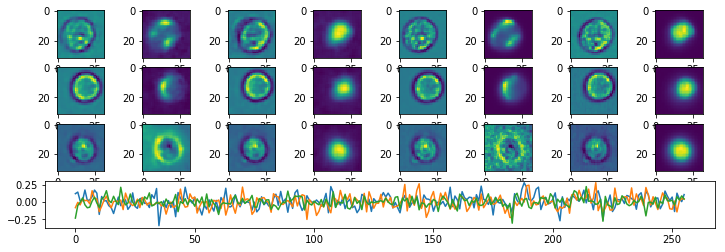

Epoch:  37 Iteration:  0 Loss:  2.18128 0.629725 0.000423938


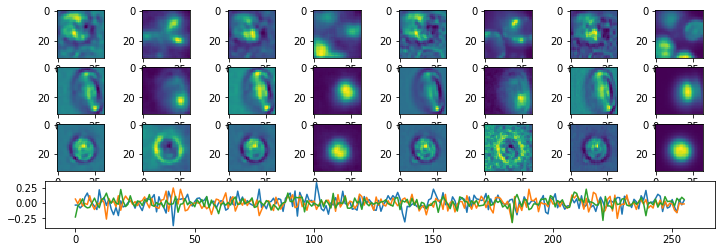

Epoch:  37 Iteration:  500 Loss:  2.26701 0.629942 0.000417799


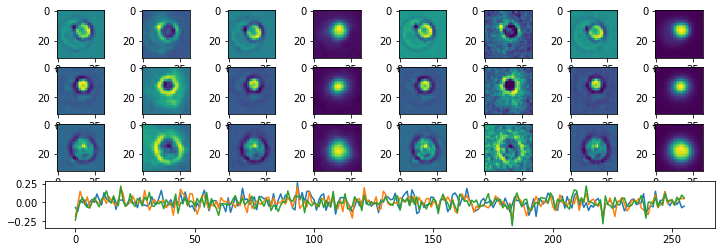

Epoch:  37 Iteration:  1000 Loss:  2.19278 0.62988 0.000103503


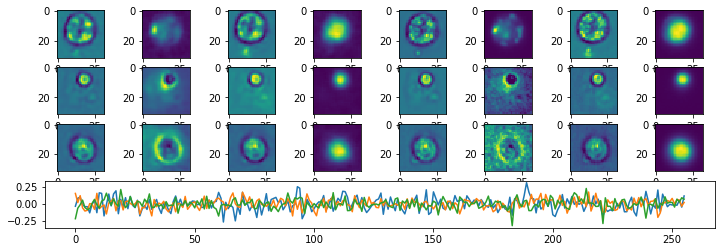

Epoch:  38 Iteration:  0 Loss:  2.16808 0.629718 0.000199556


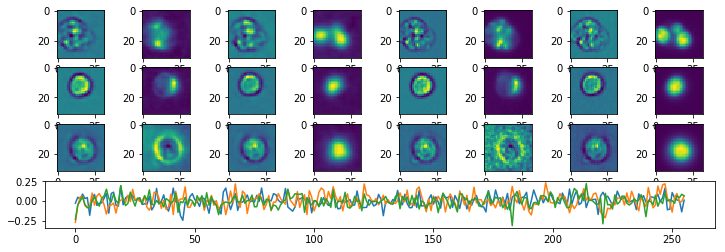

Epoch:  38 Iteration:  500 Loss:  2.24617 0.629932 0.000250697


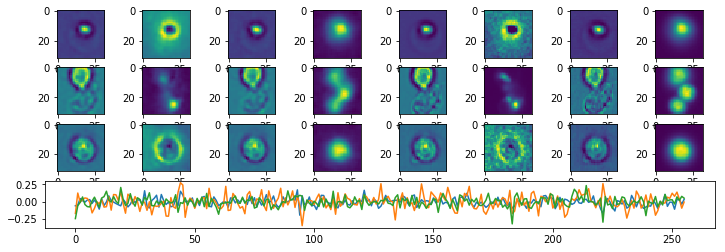

Epoch:  38 Iteration:  1000 Loss:  2.18072 0.629874 0.000322968


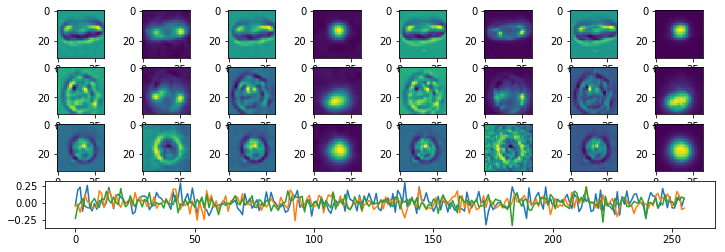

Epoch:  39 Iteration:  0 Loss:  2.16146 0.629715 0.000510156


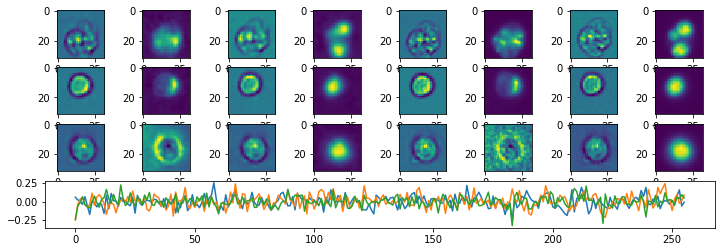

Epoch:  39 Iteration:  500 Loss:  2.24228 0.629925 0.000168622


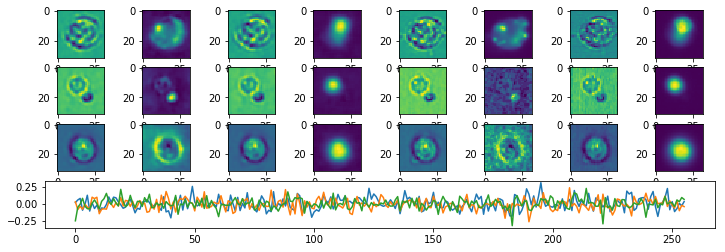

Epoch:  39 Iteration:  1000 Loss:  2.1792 0.629872 0.000345886


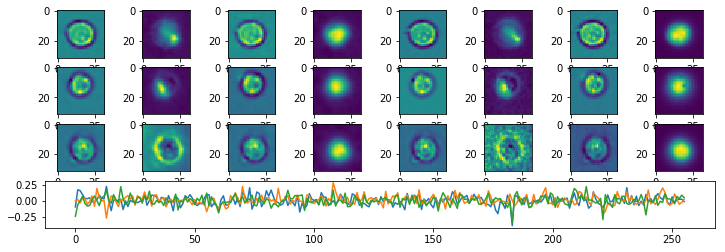

Done


In [5]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 40
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 256 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-04-18-mmCompensatedTifs"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4